# Diabetes Prediction for Pima Indian Females

## Context

This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.

A copy of this data is available at https://www.kaggle.com/uciml/pima-indians-diabetes-database.

## Objective

As a diagnostic tool, predict whether or not a patient has diabetes based on certain diagnostic measurements included in the dataset. 

## Content
Predictors
 
1. Pregnancies: Number of times pregnant
2. Glucose: Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. BloodPressure: Diastolic blood pressure (mm Hg)
4. SkinThickness: Triceps skin fold thickness (mm)
5. Insulin: 2-Hour serum insulin (mu U/ml)
6. BMI: Body mass index (weight in kg/(height in m)^2)
7. DiabetesPedigreeFunction: Diabetes pedigree function
8. Age: Age (years)

Outcome
* 1 if diabetes
* 0 if no diabetes

###### License: [CC0: Public Domain](https://creativecommons.org/publicdomain/zero/1.0/)

### Prepare Analysis
* Load required libraries
* Load the data set
* Validate the data columns with info()
* Make a working copy to preserve raw data

#### Load required libraries

In [1]:
import pandas as pd
import numpy as np
from scipy.stats import randint

import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb
import lightgbm as lgb

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn import svm
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from lightgbm import LGBMClassifier

import shap
from dtreeviz import trees

%matplotlib inline

#### Load the data set

In [2]:
df_raw = pd.read_csv('data/diabetes.csv')
df_raw.shape

(768, 9)

#### Validate the data columns with info()

In [3]:
df_raw.info(verbose=True, memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


#### Make a working copy to preserve raw data


In [4]:
df_diabetes_main = df_raw.copy(deep=True)

### Data Inspection

* Visually inspect some of the rows
* Summarize the table with describe
* Check for zero values that represent missing data
* Check for null values
* Determine if the output classes are imbalanced



* Look at some rows where some condition is true, like 0 values
* Look at some 2-dimensional crosstabs


#### Visually inspect some of the rows

In [5]:
df_diabetes_main.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [6]:
df_diabetes_main.sample(20)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
653,2,120,54,0,0,26.8,0.455,27,0
569,0,121,66,30,165,34.3,0.203,33,1
393,4,116,72,12,87,22.1,0.463,37,0
666,4,145,82,18,0,32.5,0.235,70,1
225,1,87,78,27,32,34.6,0.101,22,0
480,3,158,70,30,328,35.5,0.344,35,1
444,4,117,62,12,0,29.7,0.380,30,1
336,0,117,0,0,0,33.8,0.932,44,0
164,0,131,88,0,0,31.6,0.743,32,1
363,4,146,78,0,0,38.5,0.520,67,1


Some fields have 0 values. In particular, these fields should not have zero values if measured, so the zeros must be missing data:
* Glucose
* BloodPressure
* SkinThickness
* Insulin
* BMI

Zero values must be dropped and treated as missing (at random?).

#### Summarize the table with describe

* Validate the zeros appearing in Glucose, BloodPressure, SkinThickness, Insulin, and BMI
* Validate that Age is greater or equal to 21 as stated in the dataset information provided


In [7]:
df_diabetes_main.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


#### Check for zero values that represent missing data

In [8]:
df_diabetes_main.isin([0]).sum()

Pregnancies                 111
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                     500
dtype: int64

#### Check for null values

In [9]:
df_diabetes_main.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

#### Determine if the output classes are imbalanced

In [10]:
class_balance = pd.DataFrame([
    df_diabetes_main['Outcome'].value_counts(), 
    df_diabetes_main['Outcome'].value_counts(normalize=True)
    ], index=['count', 'percent']
    )
class_balance

,0,1
count,500.000000,268.000000
percent,0.651042,0.348958


In [11]:
# Replace all the 0 values that are truly missing data with NaN
df_diabetes_nan = df_diabetes_main.replace({
    'Glucose': 0,
    'BloodPressure': 0, 
    'SkinThickness': 0, 
    'Insulin': 0,
    'BMI': 0
}, np.NaN)

In [12]:
df_diabetes_nan

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.0,180.0,32.9,0.171,63,0
764,2,122.0,70.0,27.0,NaN,36.8,0.340,27,0
765,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,1,126.0,60.0,NaN,NaN,30.1,0.349,47,1


### Impute missing values

The zero values in 5 columns (Glucose, Blood Pressure, Skin Thickness, Insulin, BMI) are not legitimate, and represent missing data in the set.

There are several ways to impute missing values. sklearn has a tool to impute simple mean/median/mode. Here, I use visual inspection / describe on the data frame to determine which to use. Looking at the histograms, I use mean where the data is unskewed, and we use medians when the skew of the data is large. 

sklearn can do more complicated imputing, which we can try later.

In [13]:
df_diabetes_nan['Glucose'].fillna(df_diabetes_nan['Glucose'].mean(), inplace=True)
df_diabetes_nan['BloodPressure'].fillna(df_diabetes_nan['BloodPressure'].mean(), inplace=True)
df_diabetes_nan['SkinThickness'].fillna(df_diabetes_nan['SkinThickness'].median(), inplace=True)
df_diabetes_nan['Insulin'].fillna(df_diabetes_nan['Insulin'].median(), inplace=True)
df_diabetes_nan['BMI'].fillna(df_diabetes_nan['BMI'].median(), inplace=True)

In [14]:
df_diabetes_nan

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,125.0,33.6,0.627,50,1
1,1,85.0,66.0,29.0,125.0,26.6,0.351,31,0
2,8,183.0,64.0,29.0,125.0,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.0,180.0,32.9,0.171,63,0
764,2,122.0,70.0,27.0,125.0,36.8,0.340,27,0
765,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,1,126.0,60.0,29.0,125.0,30.1,0.349,47,1


In [15]:
df_diabetes_nan.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,121.686763,72.405184,29.108073,140.671875,32.455208,0.471876,33.240885,0.348958
std,3.369578,30.435949,12.096346,8.791221,86.383060,6.875177,0.331329,11.760232,0.476951
min,0.000000,44.000000,24.000000,7.000000,14.000000,18.200000,0.078000,21.000000,0.000000
25%,1.000000,99.750000,64.000000,25.000000,121.500000,27.500000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.202592,29.000000,125.000000,32.300000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


### (What about outlier detection / removal?)

### Charting and Visual Exploration

* Look at the distribution of each variable
* Chart values as a recorded sequence 

#### Look at the distribution of each variable

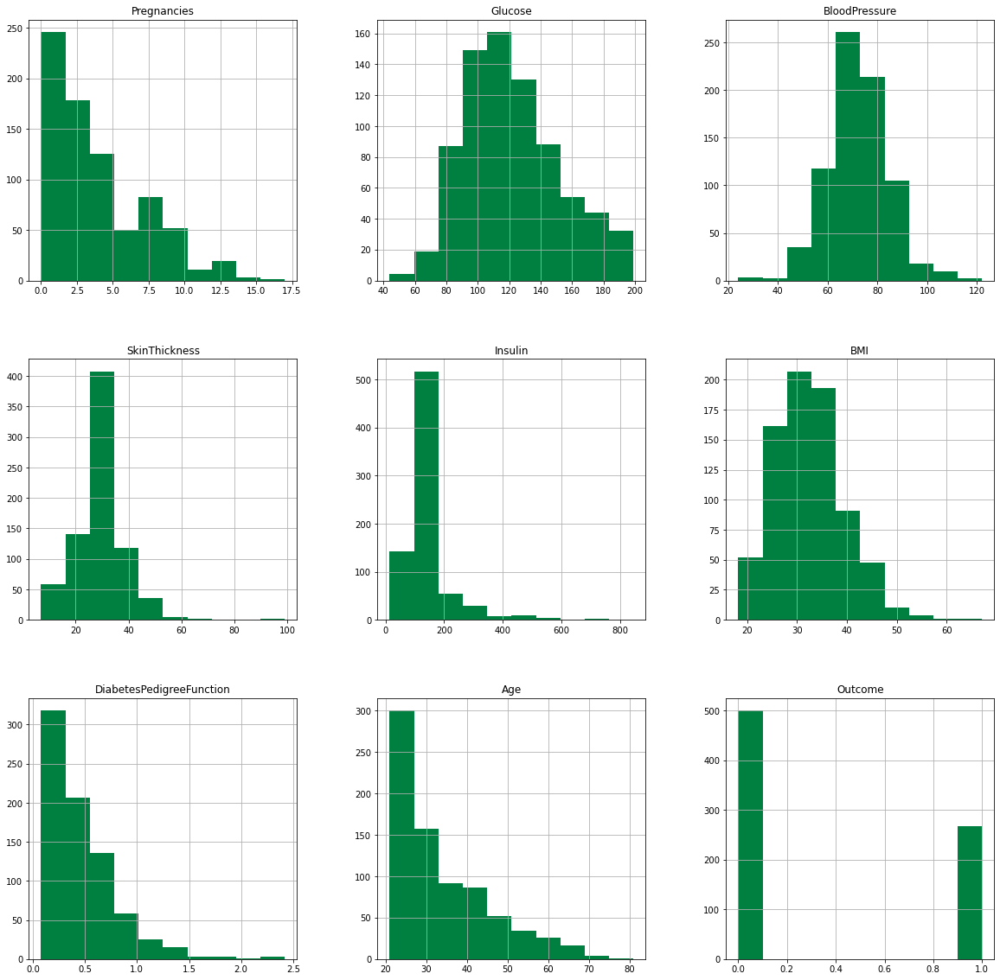

In [16]:
a = df_diabetes_nan.hist(figsize = (20,20), color="#008040")


### (Transform any values)

#### Chart values as a recorded sequence

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>], dtype=object)

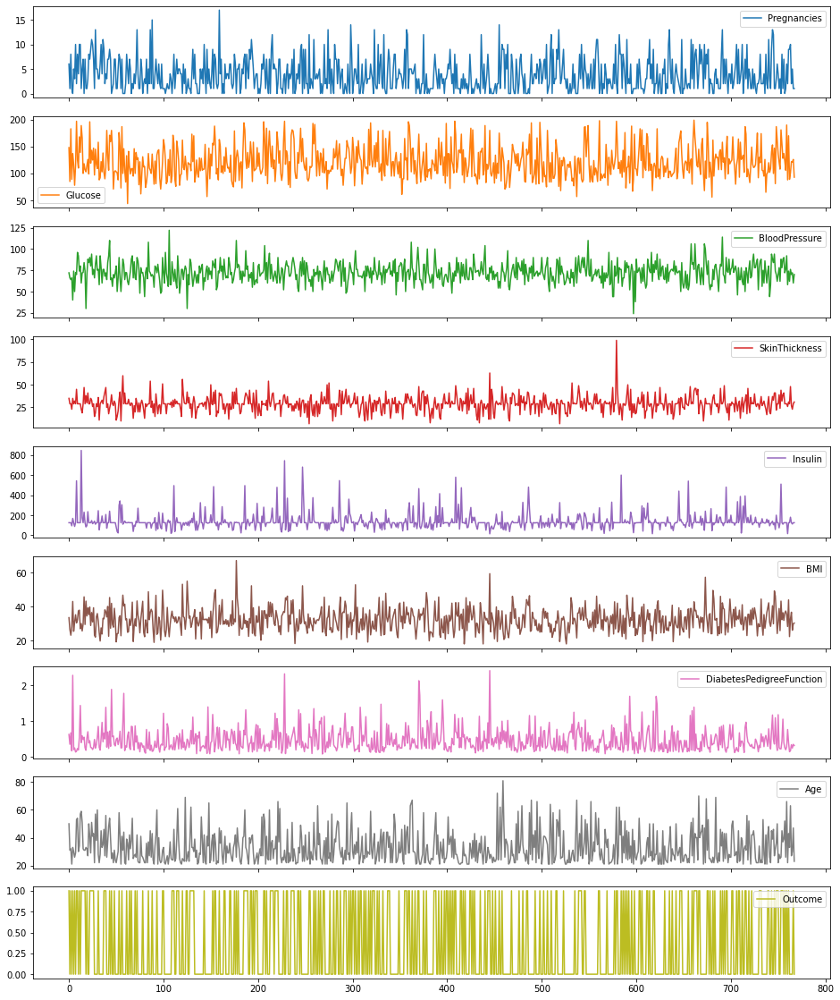

In [17]:
df_diabetes_nan.plot(subplots=True, figsize=(16,20))

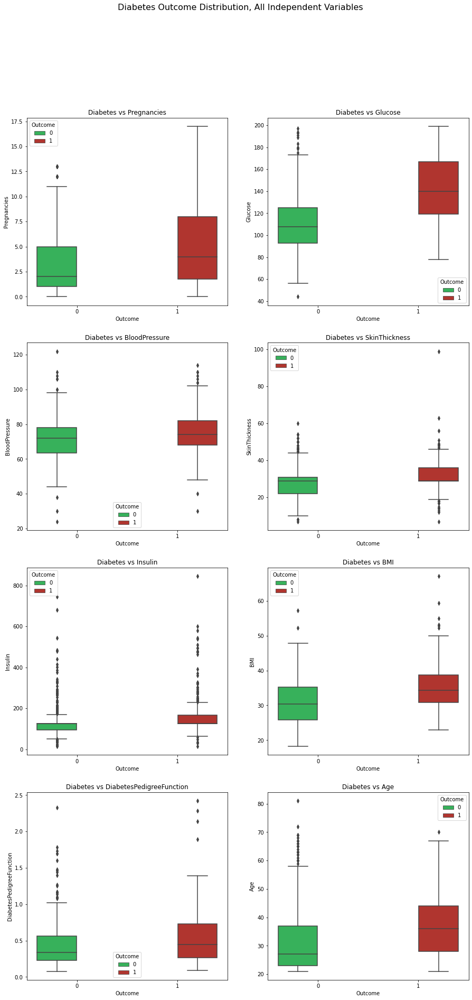

In [18]:
fig, axes = plt.subplots(4, 2, figsize=(15, 30))
fig.suptitle('Diabetes Outcome Distribution, All Independent Variables', fontsize=16)
axes_map = {
    'Pregnancies': axes[0,0],
    'Glucose': axes[0,1],
    'BloodPressure': axes[1,0],
    'SkinThickness': axes[1,1],
    'Insulin': axes[2,0],
    'BMI': axes[2,1],
    'DiabetesPedigreeFunction': axes[3,0],
    'Age': axes[3,1]
}
outcome = df_diabetes_nan['Outcome']
palette = ('#23C552', '#C52219')

for name, ax in axes_map.items():
    sns.boxplot(ax=ax, x=outcome, y=df_diabetes_nan[name], hue=outcome, palette=palette)
    ax.set_title(f"Diabetes vs {name}", fontsize=12)


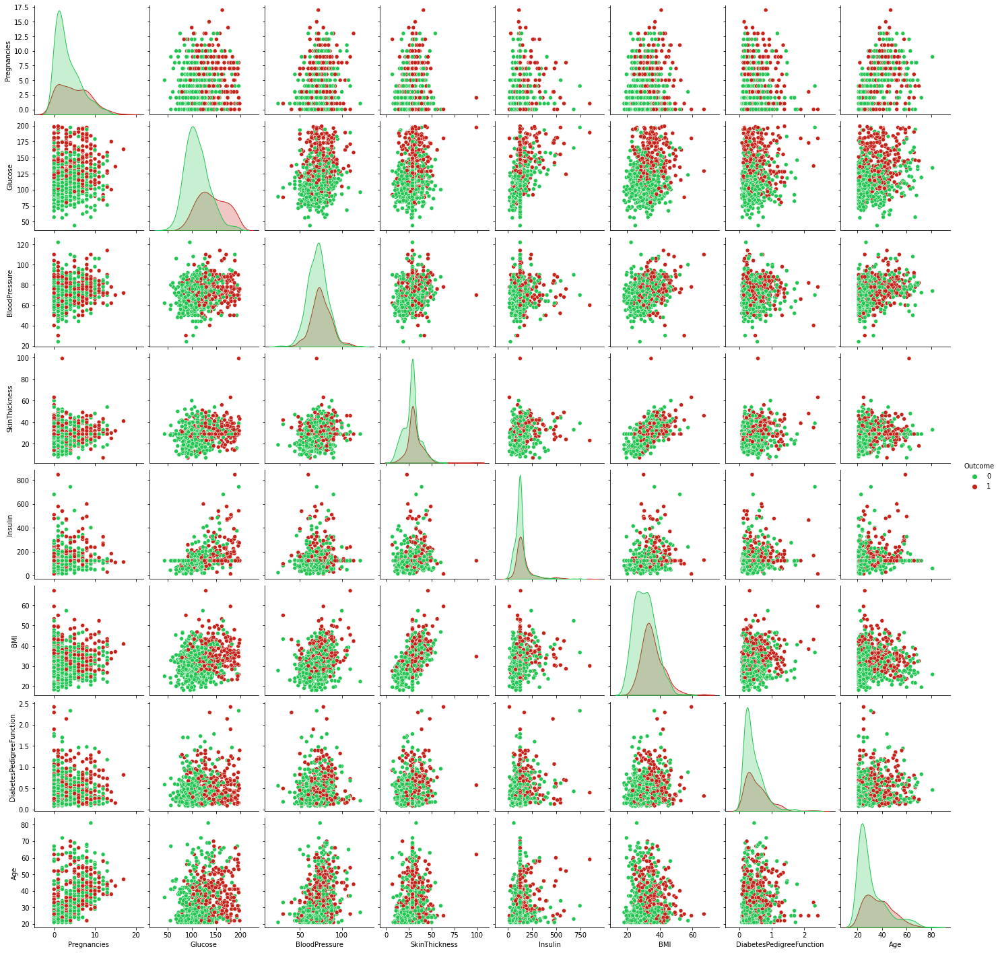

In [19]:
sns.pairplot(df_diabetes_nan, hue='Outcome', palette=palette)

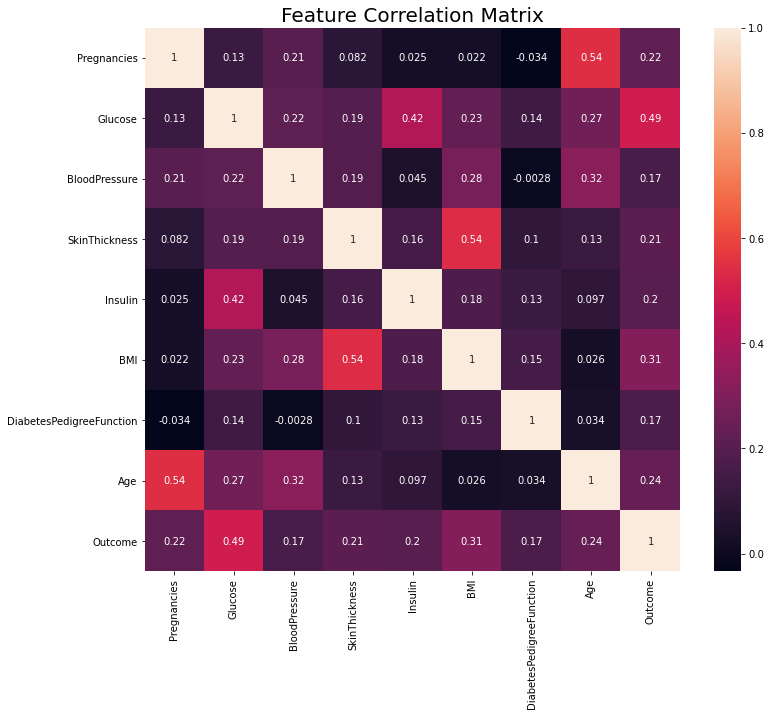

In [20]:
plt.figure(figsize=(12, 10))
sns.heatmap(df_diabetes_nan.corr(), annot=True)
plt.title("Feature Correlation Matrix", fontsize=20)
plt.show()

<AxesSubplot:>

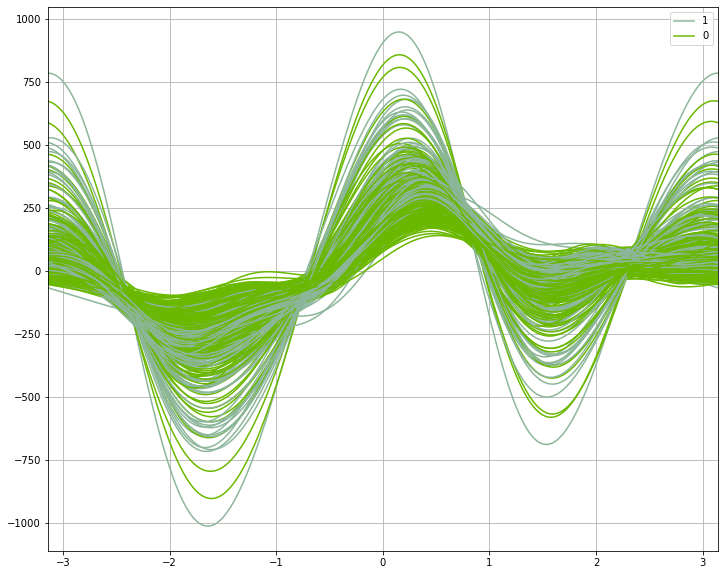

In [21]:
from pandas.plotting import andrews_curves

plt.figure(figsize=(12, 10))
andrews_curves(df_diabetes_nan, "Outcome")


<AxesSubplot:>

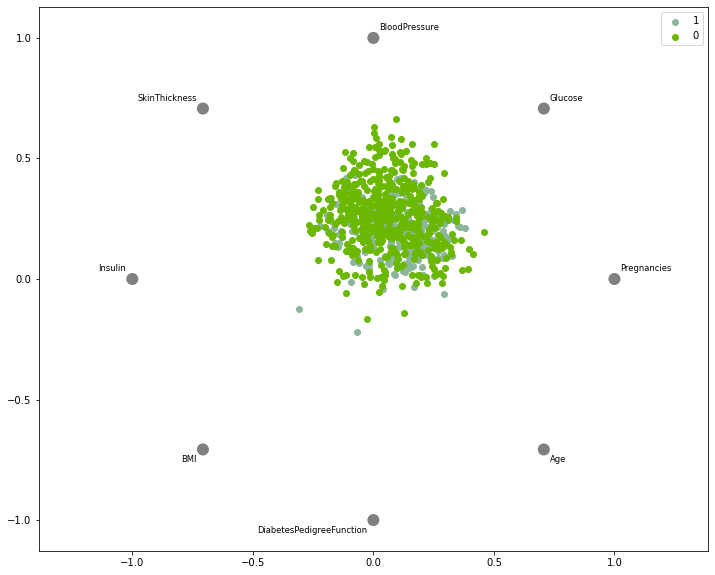

In [22]:
from pandas.plotting import radviz

plt.figure(figsize=(12, 10))
radviz(df_diabetes_nan, "Outcome")

<AxesSubplot:>

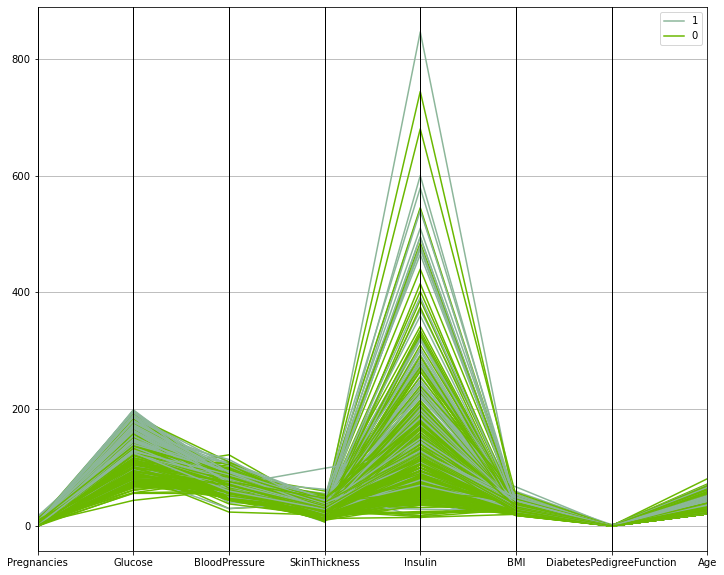

In [23]:
from pandas.plotting import parallel_coordinates

plt.figure(figsize=(12, 10))
parallel_coordinates(df_diabetes_nan, "Outcome")


In [24]:
Y = df_diabetes_nan.loc[:, 'Glucose']
X = df_diabetes_nan[['Pregnancies']]

seed = 7
test_size = 0.3

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)


### Modeling

Since our objective is to diagnose one of the two classes (no diabetes, diabetes) given the 8 inputs, this is a binary classification problem.

We want to start by seeing how much the simplest model predicts. The reason is twofold:
1. We need a baseline to compare future models above the simple random guess.
2. We need to make a tradeoff between complexity and our metric.

Recall that our worst case, simplest classification would be to just guess the majority class, "no diabetes", for everyone. Our expected accuracy would be around 65%, but we'd never identify a single person with diabetes - not great.

In [25]:
class_balance

,0,1
count,500.000000,268.000000
percent,0.651042,0.348958


In [26]:
Y = df_diabetes_nan.loc[:, 'Outcome']

One thing we saw in our visual analysis is the potential relationship between Glucose and Outcome. The correlation was higher than other variables in the set. Let's see how much better our model gets by taking Glucose into effect.

In [27]:
df_diabetes_nan.groupby('Outcome')['Glucose'].agg(['mean', 'std'])

,mean,std
Outcome,,
0,110.710121,24.71706
1,142.165573,29.54175


In [28]:
seed = 7
test_size = 0.3

X = df_diabetes_nan[['Glucose']]
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=seed)

In [29]:
logreg = LogisticRegression()
logreg.fit(X_train, Y_train)
Y_pred = logreg.predict(X_test)

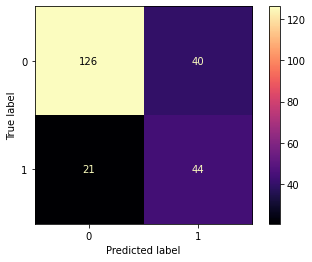

In [30]:
conf = metrics.confusion_matrix(Y_pred, Y_test, labels=logreg.classes_)
tn, fp, fn, tp = conf.ravel()
cm = metrics.ConfusionMatrixDisplay(confusion_matrix=conf, display_labels=logreg.classes_)

cm.plot(cmap="magma")

In [31]:
# Metrics
print(f"Accuracy: {metrics.accuracy_score(Y_test, Y_pred)*100:.2f}%")
print(f"False Positive Rate (Type I error): {fp / (fp + tn)*100:.2f}%")
print(f"False Negative Rate (Type II error): {fn / (fn + tp)*100:.2f}%")
print(f"True Negative Rate (Specificity): {tn / (tn + fp)*100:.2f}%")
print(f"Negative Predictive Value: {tn / (tn + fn)*100:.2f}%")
print(f"False Discovery Rate: {fp / (tp + fp)*100:.2f}%")
print(f"True Positive Rate (Recall): {tp / (tp + fn)*100:.2f}%")
print(f"Positive Predictive Value: {tp / (tp + fp)*100:.2f}%")
# print(f"F beta Score: {metrics.fbeta_score(Y_test, Y_pred, beta=1.5)*100:.2f}%")
print(f"F1 Score: {metrics.f1_score(Y_test, Y_pred)*100:.2f}%")
print(f"Cohen Kappa: {metrics.cohen_kappa_score(Y_test, Y_pred)*100:.2f}%")
print(f"Matthews Correlation Coefficient: {metrics.matthews_corrcoef(Y_test, Y_pred)*100:.2f}%")



Accuracy: 73.59%
False Positive Rate (Type I error): 24.10%
False Negative Rate (Type II error): 32.31%
True Negative Rate (Specificity): 75.90%
Negative Predictive Value: 85.71%
False Discovery Rate: 47.62%
True Positive Rate (Recall): 67.69%
Positive Predictive Value: 52.38%
F1 Score: 59.06%
Cohen Kappa: 40.04%
Matthews Correlation Coefficient: 40.75%


OK, so we have two models now:

1. Assign the majority class (everyone=0, no diabetes).
2. Use a simple Logistic Regression based only on Glucose

We can see if we can get better results with the same data using several methods.

In [32]:
def run_models(X_train, Y_train, X_test) -> pd.DataFrame:
    results = []
    classifiers = ['Linear SVM', 'Radial SVM', 'Logistic Regression', 'KNN', 'Decision Tree', 'LightGBM']
    model_params = {
        'random_state': 1234,
        'learning_rate': 0.1,
        'n_estimators': 10
        }

    models = [
        svm.SVC(kernel='linear'),
        svm.SVC(kernel='rbf'),
        LogisticRegression(),
        KNeighborsClassifier(n_neighbors=4),
        DecisionTreeClassifier(),
        lgb.LGBMClassifier(**model_params)
        ]

    for model in models:
        model.fit(X_train, Y_train)
        prediction = model.predict(X_test)
        results.append(metrics.accuracy_score(prediction, Y_test))

    models_df = pd.DataFrame(results, index=classifiers)
    models_df.columns=['Accuracy']
    return models_df

In [33]:
run_models(X_train, Y_train, X_test)

,Accuracy
Linear SVM,0.735931
Radial SVM,0.735931
Logistic Regression,0.735931
KNN,0.709957
Decision Tree,0.679654
LightGBM,0.735931


So we can achieve around 74% accuracy with SVM, but not a large improvement. Let's see how that changes when we scale the data first.

Study question: what is 1 dimensional SVM doing? What is 1 dimensional logistic regression doing? Is there a reason the results are the same.

We can use train_test_split to stratify the sample first.

In [34]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=test_size, random_state=seed, stratify=Y)
run_models(X_train, Y_train, X_test)

,Accuracy
Linear SVM,0.740260
Radial SVM,0.740260
Logistic Regression,0.735931
KNN,0.722944
Decision Tree,0.683983
LightGBM,0.744589


In [35]:
sc = StandardScaler()
X_scaled = sc.fit_transform(df_diabetes_nan[['Glucose']])

X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y, test_size=test_size, random_state=seed, stratify=Y)
run_models(X_train, Y_train, X_test)

,Accuracy
Linear SVM,0.740260
Radial SVM,0.740260
Logistic Regression,0.735931
KNN,0.727273
Decision Tree,0.679654
LightGBM,0.744589


In [36]:
sc = StandardScaler()
X = df_diabetes_nan[['Glucose', 'BMI']]
X_scaled = sc.fit_transform(X)

X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y, test_size=test_size, random_state=seed, stratify=Y)
run_models(X_train, Y_train, X_test)

,Accuracy
Linear SVM,0.761905
Radial SVM,0.766234
Logistic Regression,0.757576
KNN,0.744589
Decision Tree,0.709957
LightGBM,0.757576


In [37]:
sc = StandardScaler()
X = df_diabetes_nan.loc[:, 'Pregnancies':'Age']
X_scaled = sc.fit_transform(X)

X_train, X_test, Y_train, Y_test = train_test_split(X_scaled, Y, test_size=test_size, random_state=seed, stratify=Y)
run_models(X_train, Y_train, X_test)

,Accuracy
Linear SVM,0.744589
Radial SVM,0.731602
Logistic Regression,0.766234
KNN,0.731602
Decision Tree,0.722944
LightGBM,0.740260


In [38]:
dtrain = xgb.DMatrix(X, Y)
params = {"max_depth":3, "eta":0.05, "objective": "binary:logistic", "subsample":1, "eval_metric":'logloss'}
xgb_model = xgb.train(params=params, dtrain=dtrain, num_boost_round=8)

In [39]:
xgb_model.trees_to_dataframe().query("Tree == 0")

,Tree,Node,ID,Feature,Split,Yes,No,Missing,Gain,Cover
0,0,0,0-0,Glucose,127.500000,0-1,0-2,0-1,125.387550,192.00
1,0,1,0-1,Age,29.000000,0-3,0-4,0-3,27.484222,121.25
2,0,2,0-2,BMI,29.950001,0-5,0-6,0-5,34.431122,70.75
3,0,3,0-3,BMI,45.400002,0-7,0-8,0-7,6.552994,67.75
4,0,4,0-4,BMI,26.350000,0-9,0-10,0-9,17.676075,53.50
5,0,5,0-5,Glucose,145.500000,0-11,0-12,0-11,8.615974,18.75
6,0,6,0-6,Glucose,157.500000,0-13,0-14,0-13,13.042137,52.00
7,0,7,0-7,Leaf,NaN,NaN,NaN,NaN,-0.083764,66.75
8,0,8,0-8,Leaf,NaN,NaN,NaN,NaN,0.025000,1.00
9,0,9,0-9,Leaf,NaN,NaN,NaN,NaN,-0.090698,9.75


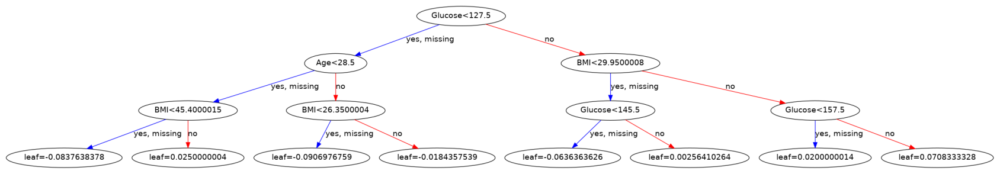

In [40]:
xgb.plot_tree(xgb_model)
fig = plt.gcf()
fig.set_size_inches(30,20)

<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

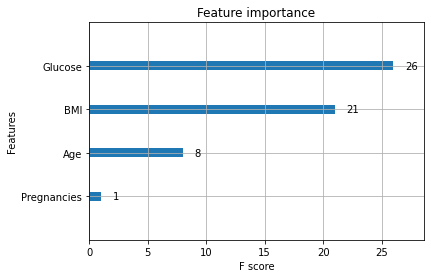

In [41]:
xgb.plot_importance(xgb_model)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


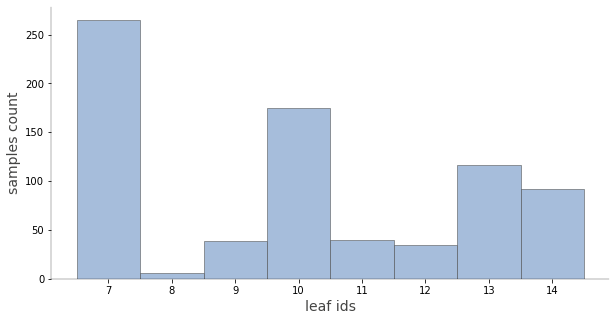

In [42]:
trees.viz_leaf_samples(xgb_model, X, X.columns, tree_index=1)

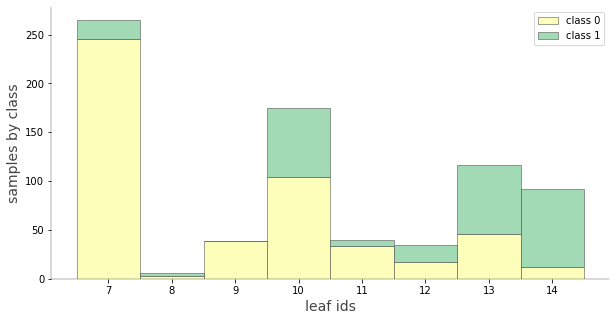

In [43]:
trees.ctreeviz_leaf_samples(xgb_model, X, Y, X.columns, tree_index=1)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


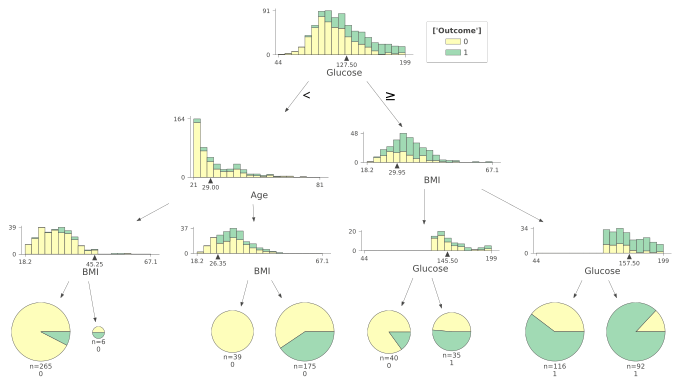

In [44]:
trees.dtreeviz(xgb_model, X, Y, X.columns, ['Outcome'], class_names=[0, 1], tree_index=1)

In [45]:
trees.describe_node_sample(xgb_model, 1, X, feature_names=X.columns, tree_index=1)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
count,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000
mean,3.534021,102.625637,70.379204,28.000000,117.923711,31.348866,0.443538,30.952577
std,3.191766,15.534087,11.809134,8.459187,50.536546,6.544339,0.294342,10.285180
min,0.000000,44.000000,24.000000,7.000000,15.000000,18.200000,0.078000,21.000000
25%,1.000000,92.000000,62.000000,23.000000,94.000000,26.400000,0.235000,23.000000
50%,2.000000,104.000000,70.000000,29.000000,125.000000,31.200000,0.349000,27.000000
75%,5.000000,115.000000,78.000000,31.000000,125.000000,35.500000,0.587000,37.000000
max,14.000000,127.000000,122.000000,60.000000,600.000000,57.300000,1.731000,72.000000


In [46]:
print(X.iloc[10], '\n\n', Y.iloc[10], '\n\n', trees.explain_prediction_path(xgb_model, X.iloc[10], X, Y, explanation_type="plain_english", feature_names=X.columns, tree_index=1))


Pregnancies                   4.000
Glucose                     110.000
BloodPressure                92.000
SkinThickness                29.000
Insulin                     125.000
BMI                          37.600
DiabetesPedigreeFunction      0.191
Age                          30.000
Name: 10, dtype: float64 

 0 

 Glucose < 127.5
26.35 <= BMI 
29.0 <= Age 



In [47]:
shap_values = shap.TreeExplainer(xgb_model).shap_values(X)

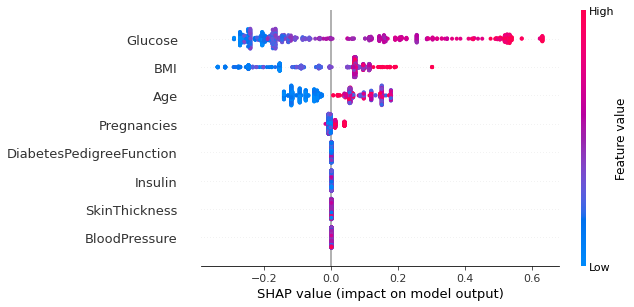

In [48]:
shap.summary_plot(shap_values, X)

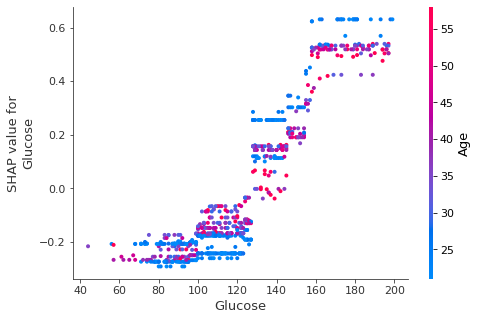

In [49]:
shap.dependence_plot('Glucose', shap_values, X)

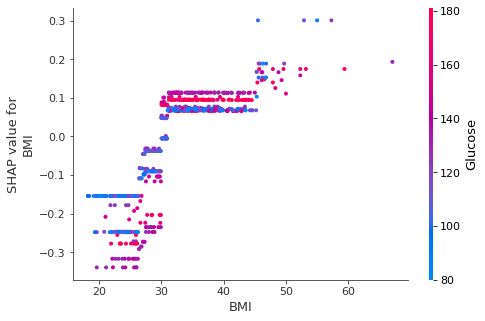

In [50]:
shap.dependence_plot('BMI', shap_values, X)

In [51]:
shap_interaction_values = shap.TreeExplainer(xgb_model).shap_interaction_values(X)

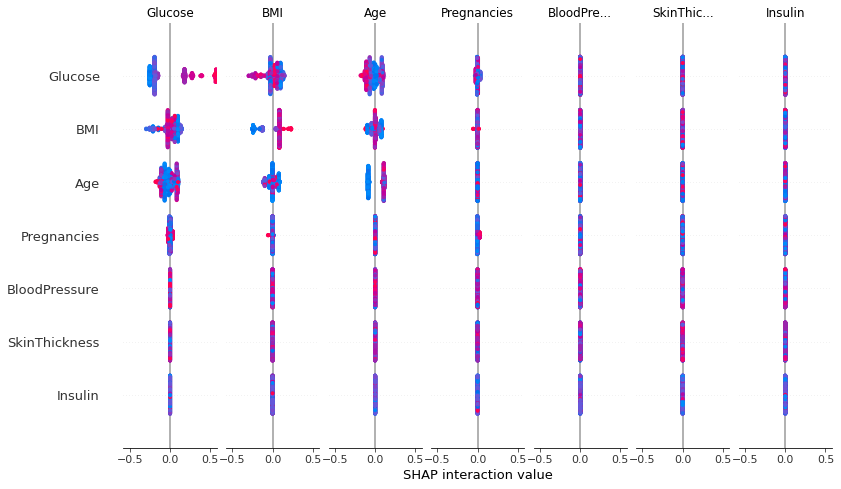

In [52]:
shap.summary_plot(shap_interaction_values, X)

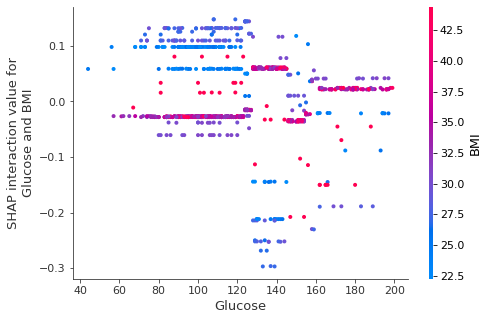

In [53]:
shap.dependence_plot(
    ("Glucose", "BMI"),
    shap_interaction_values, X
)

In [54]:
# random search example w lgbm
model_params = {
        'random_state': 1234
        }

params_test = {
    'learning_rate': [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
    'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 1000, 1500, 2000],
    'num_leaves': randint(6, 50),
    'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7]
}

n_iter = 300

grid_search = RandomizedSearchCV(
    estimator=lgb.LGBMClassifier(**model_params),
    param_distributions=params_test
)

grid_search.fit(X, Y)

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).


RandomizedSearchCV(estimator=LGBMClassifier(random_state=1234),
                   param_distributions={'learning_rate': [0.01, 0.02, 0.03,
                                                          0.04, 0.05, 0.08, 0.1,
                                                          0.2, 0.3, 0.4],
                                        'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 800, 1000,
                                                         1500, 2000],
                                        'num_leaves': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f3b2962f8e0>})

In [55]:
opt_params = grid_search.best_params_
lgbm_clf = lgb.LGBMClassifier(**opt_params)


In [56]:
lgbm_clf.fit(X_train, Y_train)
prediction = lgbm_clf.predict(X_test)
metrics.accuracy_score(prediction, Y_test)

0.7489177489177489